# Explicabilite par couches

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from IPython.display import display, HTML
import re


def render_token(token, word_scores, max_abs_score, pred_label):
    """
    Colore un mot en fonction de sa contribution à la prédiction.
    """
    lower_token = token.lower()
    if lower_token in word_scores:
        score = word_scores[lower_token]
        alpha = 0.2 + (abs(score) / max_abs_score) * 0.7

        # Couleurs selon la contribution
        if score > 0:
            color = f"rgba(0, 128, 0, {alpha:.2f})"  # Vert pour contributions positives
        else:
            color = f"rgba(178, 34, 34, {alpha:.2f})" # Rouge pour contributions négatives

        return (
            f"<span style='background-color:{color}; color: white; padding:1px 3px; "
            f"border-radius:4px; margin:0 1px; cursor:help;' "
            f"title='Contribution vers \"{pred_label}\": {score:+.4e}'>{token}</span>"
        )

    # Texte normal sans couleur de fond
    return f"<span style='color: #999;'>{token}</span>"

def generate_explanation_html(text, word_scores, pred_label, confidence, true_label):
    """
    Génère le code HTML complet pour la visualisation des explications.
    """
    if not word_scores:
        return "<div style='color: red; padding: 20px;'>Aucun mot du dictionnaire trouvé dans le texte.</div>"

    max_abs_score = max(abs(v) for v in word_scores.values())

    # Tokenisation du texte
    tokens = re.findall(r"\w+|\W+", text)
    html_output = "".join(render_token(t, word_scores, max_abs_score, pred_label) for t in tokens)

    # Déterminer si la prédiction est correcte
    is_correct = pred_label == true_label
    correctness_color = "#2ecc71" if is_correct else "#e74c3c"
    correctness_text = " CORRECT" if is_correct else " ERREUR"

    # Générer l'HTML complet
    html = f"""
    <div style="font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif;
                padding: 25px; background-color: #2c3e50; border-radius: 12px;
                color: white; margin-bottom: 25px; box-shadow: 0 4px 12px rgba(0,0,0,0.3);">

        <h3 style="margin-top:0; color: #ecf0f1; border-bottom: 2px solid #3498db;
                   padding-bottom: 10px;">
            Visualisation
        </h3>

        <div style="display: flex; justify-content: space-between; flex-wrap: wrap;
                    margin-bottom: 20px;">
            <div style="flex: 1; min-width: 250px; margin-right: 20px;">
                <p style="margin: 8px 0;">
                    <b style="color: #bdc3c7;">Classe Prédite :</b>
                    <span style="color: #3498db; font-size: 1.3em; font-weight: bold;">
                        {pred_label.upper()}
                    </span>
                </p>
                <p style="margin: 8px 0;">
                    <b style="color: #bdc3c7;">Confiance :</b>
                    <span style="font-size: 1.2em; font-weight: bold;">
                        {confidence:.1%}
                    </span>
                </p>
            </div>

            <div style="flex: 1; min-width: 250px;">
                <p style="margin: 8px 0;">
                    <b style="color: #bdc3c7;">Vérité Terrain :</b>
                    <span style="color: #e74c3c; font-size: 1.2em; font-weight: bold;">
                        {true_label.upper()}
                    </span>
                </p>
                <p style="margin: 8px 0;">
                    <b style="color: #bdc3c7;">Résultat :</b>
                    <span style="color: {correctness_color}; font-size: 1.2em; font-weight: bold;">
                        {correctness_text}
                    </span>
                </p>
            </div>
        </div>

        <div style="margin-bottom: 20px; padding: 12px; background-color: #34495e;
                    border-radius: 8px;">
            <h4 style="margin-top: 0; color: #ecf0f1;">Légende des couleurs :</h4>
            <div style="display: flex; gap: 15px; flex-wrap: wrap;">
                <div style="display: flex; align-items: center;">
                    <div style="width: 20px; height: 20px; background-color: rgba(0, 128, 0, 0.8);
                                border-radius: 4px; margin-right: 8px;"></div>
                    <span>Contribution positive → {pred_label.upper()}</span>
                </div>
                <div style="display: flex; align-items: center;">
                    <div style="width: 20px; height: 20px; background-color: rgba(178, 34, 34, 0.8);
                                border-radius: 4px; margin-right: 8px;"></div>
                    <span>Contribution négative → {pred_label.upper()}</span>
                </div>

            </div>
            <p style="margin: 8px 0 0 0; font-size: 12px; color: #bdc3c7;">
                <i>Survolez les mots colorés pour voir leur contribution exacte.</i>
            </p>
        </div>

        <hr style="border: 0; border-top: 1px solid #7f8c8d; margin: 20px 0;">

        <div style="background-color: #1a252f; padding: 20px; border-radius: 8px;
                    max-height: 400px; overflow-y: auto; line-height: 2.0;
                    font-size: 15px; text-align: justify;">
            {html_output}
        </div>

        <hr style="border: 0; border-top: 1px solid #7f8c8d; margin: 20px 0;">

        <div style="font-size: 13px; color: #bdc3c7;">
            <p style="margin: 5px 0;">
                <b>Interprétation :</b> Plus la couleur est intense (verte ou rouge),
                plus le mot influence fortement la prédiction vers ou contre la classe "{pred_label}".
            </p>

        </div>
    </div>
    """

    return html

def visualize_text_explanations(text, word_scores, pred_label, confidence, true_label):
    """
    Affiche la visualisation  des explications.
    """

    print("Visualisation des contrib par mot ")

    html_content = generate_explanation_html(text, word_scores, pred_label, confidence, true_label)
    display(HTML(html_content))


def explain_prediction_by_layers(model, tfidf, le, text, true_label, device, top_k=15, visualize=True):
    """
    analyse l'influence des termes sur la prédiction à travers chaque couche du réseau.
    rétropropagation pour identifier les poids les plus discriminants.
    """

    model.eval()

    # vectorisation du texte avec le vectoriseur TF-IDF entraîné
    X = tfidf.transform([text]).toarray()
    X_tensor = torch.FloatTensor(X).to(device)
    X_tensor.requires_grad = True

    feature_names = tfidf.get_feature_names_out()  # récupère la liste des mots du vocabulaire TF-IDF


    # passe avant, récupère les sorties ET les activations des couches cachées
    outputs, activations = model(X_tensor, return_activations=True)


    probs = torch.softmax(outputs.detach(), dim=1)  # convertit les logits en probabilités avec softmax
    pred_class = outputs.argmax(1).item()  # trouve l'indice de la classe avec la plus haute probabilité
    pred_label = le.inverse_transform([pred_class])[0]  # convertit l'indice numérique en label textuel (ex: 0 -> 'homme')
    confidence = probs[0, pred_class].item()  # récupère la valeur de confiance (probabilité) pour la classe prédite



    print(f"texte analysé: {text[:200]}...")
    print(f"prédiction: {pred_label.upper()} (confiance: {confidence:.1%})")
    print(f"vérité terrain: {true_label.upper()}")
    if pred_label != true_label:
        print("  erreur de classification")


    if visualize:
        # calcule les gradients de la sortie par rapport à l'entrée et aux activations
        gradients_tuple = torch.autograd.grad(
            outputs=outputs[0, pred_class],  # on prend le gradient pour la classe prédite
            inputs=[X_tensor, activations['a1'], activations['a2']],  # par rapport à l'entrée et aux couches cachées
            retain_graph=True  # conserve le graphe de calcul pour les prochaines étapes
        )

        grad_input = gradients_tuple[0].cpu().numpy().flatten()  # gradient de la sortie par rapport à l'entrée TF-IDF
        contributions = grad_input * X[0]  # contribution de chaque terme = gradient × valeur TF-IDF

        # identification des mots  présents dans le texte (valeur TF-IDF > 0)
        present_indices = np.where(X[0] > 0)[0]
        # création d'un dictionnaire {mot: contribution}
        word_scores = {feature_names[i]: contributions[i] for i in present_indices}

        # appelle la fonction pour la visualisation du chink avec les mots colores
        visualize_text_explanations(
            text=text,
            word_scores=word_scores,
            pred_label=pred_label,
            confidence=confidence,
            true_label=true_label
        )


    # on boucle sur les deux classes (homme et femme)
    for target_class_idx, target_class_name in enumerate(le.classes_):
        marker = ""  # marqueur pour indiquer si c'est la classe prédite ou la vraie classe
        if target_class_name == pred_label:
            marker = "  prédite"
        elif target_class_name == true_label:
            marker = "  vraie classe"


        print(f"# analyse pour la classe: {target_class_name.upper()}{marker}")
        print(f"# logit: {outputs[0, target_class_idx].item():.4f}")  # valeur du logit (avant softmax) pour cette classe


        # calcul des gradients pour la classe courante
        gradients_tuple = torch.autograd.grad(
            outputs=outputs[0, target_class_idx],  # gradient pour la classe cible
            inputs=[X_tensor, activations['a1'], activations['a2']],
            retain_graph=True
        )

        # extraction des gradients pour chaque couche
        grad_input = gradients_tuple[0].cpu().numpy().flatten()  # gradient par rapport à l'entrée
        grad_a1 = gradients_tuple[1].cpu().numpy()[0]  # gradient par rapport aux activations de la couche 1
        grad_a2 = gradients_tuple[2].cpu().numpy()[0]  # gradient par rapport aux activations de la couche 2

        # extraction des activations (valeurs après application de la fonction d'activation)
        a1 = activations['a1'][0].detach().cpu().numpy()  # activations de la couche 1 (64 neurones)
        a2 = activations['a2'][0].detach().cpu().numpy()  # activations de la couche 2 (32 neurones)


        print("chain rule : ∂sortie/∂terme = Σ ∂sortie/∂L2 × ∂L2/∂L1 × ∂L1/∂terme")
        print("ordre de la rétropropagation : sortie → L2 → L1 → terme")


        # contrib finale via tt le reseau
        print(f" couche de sortie → termes via tout le réseau")
        print(f"calcul : ∂sortie/∂terme = Σ [∂sortie/∂L2 × ∂L2/∂L1 × ∂L1/∂terme]")


        # extraction des matrices de poids du modèle
        W1 = model.fc1.weight.data.cpu().numpy()  # poids de la couche 1: [64 neurones × vocab_size]
        W2 = model.fc2.weight.data.cpu().numpy()  # poids de la couche 2: [32 neurones × 64 neurones]
        W3 = model.fc3.weight.data.cpu().numpy()  # poids de la couche de sortie: [2 classes × 32 neurones]
        class_weights = W3[target_class_idx]  # poids spécifiques à la classe cible (connexions L2 → sortie)

        # calcul de la contribution de chaque terme via toute l'architecture: terme → L1 → L2 → sortie
        term_contrib_output = np.zeros(len(feature_names))  # initialisation du vecteur de contributions
        for l2_idx in range(len(a2)):  # pour chaque neurone de la couche L2 (32 neurones)
            l2_weight_to_output = class_weights[l2_idx]  # poids de connexion L2[l2_idx] → sortie[classe]
            l2_weights_from_l1 = W2[l2_idx]  # poids des connexions L1 → L2[l2_idx]
            for l1_idx in range(len(a1)):  # pour chaque neurone de la couche L1 (64 neurones)
                l1_weights = W1[l1_idx]  # poids des connexions termes → L1[l1_idx]
                # contribution totale via ce chemin: terme → L1[l1_idx] → L2[l2_idx] → sortie
                term_contrib_output += l1_weights * X[0] * grad_a1[l1_idx] * l2_weights_from_l1[l1_idx] * l2_weight_to_output

        # séparation des termes en deux groupes: ceux qui poussent vers la classe et ceux qui l'éloignent
        terms_pushing_output = [(feature_names[i], term_contrib_output[i], X[0, i])
                                for i in range(len(term_contrib_output))
                                if term_contrib_output[i] > 0 and X[0, i] > 0]  # contributions positives ET terme présent
        terms_pulling_output = [(feature_names[i], term_contrib_output[i], X[0, i])
                                for i in range(len(term_contrib_output))
                                if term_contrib_output[i] < 0 and X[0, i] > 0]  # contributions négatives ET terme présent

        # tri des termes par contribution absolue (du plus influent au moins influent)
        terms_pushing_output.sort(key=lambda x: x[1], reverse=True)  # termes positifs triés par valeur décroissante
        terms_pulling_output.sort(key=lambda x: x[1])  # termes négatifs triés par valeur croissante (plus négatif d'abord)

        print(f"\n termes poussant vers '{target_class_name.upper()}' (contribution finale):")
        print(f"   {'rang':<6} {'terme':<30} {'contribution':<15} {'tf-idf':<10}")
        print(f"   {'-'*65}")
        for rank, (term, contrib, tfidf_val) in enumerate(terms_pushing_output[:top_k], 1):
            print(f"   {rank:<6} {term:<30} {contrib:+.6f}       {tfidf_val:.4f}")

        print(f"\n termes éloignant de '{target_class_name.upper()}' (contribution finale):")
        print(f"   {'rang':<6} {'terme':<30} {'contribution':<15} {'tf-idf':<10}")
        print(f"   {'-'*65}")
        for rank, (term, contrib, tfidf_val) in enumerate(terms_pulling_output[:top_k], 1):
            print(f"   {rank:<6} {term:<30} {contrib:+.6f}       {tfidf_val:.4f}")

        # contrib via la couche l2
        print(f"couche 2 (32 neurones) → influence via L1 → L2")
        print(f"calcul : ∂sortie/∂terme via L2 = Σ [∂sortie/∂L2 × ∂L2/∂L1 × ∂L1/∂terme]")


        # calcul de la contribution de chaque terme via les couches 1 et 2 seulement (sans la sortie)
        term_contrib_l2 = np.zeros(len(feature_names))
        for l2_idx in range(len(a2)):
            l2_weights = W2[l2_idx]  # poids L1 → L2[l2_idx]
            l2_grad = grad_a2[l2_idx]  # gradient de la sortie par rapport à L2[l2_idx]
            for l1_idx in range(len(a1)):
                l1_weights = W1[l1_idx]  # poids termes → L1[l1_idx]
                # contribution via ce chemin: terme → L1[l1_idx] → L2[l2_idx]
                term_contrib_l2 += l1_weights * X[0] * grad_a1[l1_idx] * l2_weights[l1_idx] * l2_grad

        # séparation et tri des termes pour l'étape 2
        terms_pushing_l2 = [(feature_names[i], term_contrib_l2[i], X[0, i])
                            for i in range(len(term_contrib_l2))
                            if term_contrib_l2[i] > 0 and X[0, i] > 0]
        terms_pulling_l2 = [(feature_names[i], term_contrib_l2[i], X[0, i])
                            for i in range(len(term_contrib_l2))
                            if term_contrib_l2[i] < 0 and X[0, i] > 0]

        terms_pushing_l2.sort(key=lambda x: x[1], reverse=True)
        terms_pulling_l2.sort(key=lambda x: x[1])

        print(f"\n termes poussant vers '{target_class_name.upper()}' (via L1 → L2):")
        print(f"   {'rang':<6} {'terme':<30} {'contribution':<15} {'tf-idf':<10}")
        print(f"   {'-'*65}")
        for rank, (term, contrib, tfidf_val) in enumerate(terms_pushing_l2[:top_k], 1):
            print(f"   {rank:<6} {term:<30} {contrib:+.6f}       {tfidf_val:.4f}")

        print(f"\n termes éloignant de '{target_class_name.upper()}' (via L1 → L2):")
        print(f"   {'rang':<6} {'terme':<30} {'contribution':<15} {'tf-idf':<10}")
        print(f"   {'-'*65}")
        for rank, (term, contrib, tfidf_val) in enumerate(terms_pulling_l2[:top_k], 1):
            print(f"   {rank:<6} {term:<30} {contrib:+.6f}       {tfidf_val:.4f}")


        print(f"couche 1 (64 neurones) → influence via L1 seulement")
        print(f"calcul : ∂sortie/∂terme via L1 = Σ [∂sortie/∂L1 × ∂L1/∂terme]")


        # calcul de la contribution de chaque terme via la couche 1 seulement
        term_contrib_l1 = np.zeros(len(feature_names))
        for neuron_idx in range(len(a1)):
            neuron_weights = W1[neuron_idx]  # poids termes → L1[neuron_idx]
            neuron_grad = grad_a1[neuron_idx]  # gradient de la sortie par rapport à L1[neuron_idx]
            term_contrib_l1 += neuron_weights * X[0] * neuron_grad

        # séparation et tri des termes pour l'étape 3
        terms_pushing_l1 = [(feature_names[i], term_contrib_l1[i], X[0, i])
                            for i in range(len(term_contrib_l1))
                            if term_contrib_l1[i] > 0 and X[0, i] > 0]
        terms_pulling_l1 = [(feature_names[i], term_contrib_l1[i], X[0, i])
                            for i in range(len(term_contrib_l1))
                            if term_contrib_l1[i] < 0 and X[0, i] > 0]

        terms_pushing_l1.sort(key=lambda x: x[1], reverse=True)
        terms_pulling_l1.sort(key=lambda x: x[1])

        print(f"\n termes poussant vers '{target_class_name.upper()}' (via L1):")
        print(f"   {'rang':<6} {'terme':<30} {'contribution':<15} {'tf-idf':<10}")
        print(f"   {'-'*65}")
        for rank, (term, contrib, tfidf_val) in enumerate(terms_pushing_l1[:top_k], 1):
            print(f"   {rank:<6} {term:<30} {contrib:+.6f}       {tfidf_val:.4f}")

        print(f"\n termes éloignant de '{target_class_name.upper()}' (via L1):")
        print(f"   {'rang':<6} {'terme':<30} {'contribution':<15} {'tf-idf':<10}")
        print(f"   {'-'*65}")
        for rank, (term, contrib, tfidf_val) in enumerate(terms_pulling_l1[:top_k], 1):
            print(f"   {rank:<6} {term:<30} {contrib:+.6f}       {tfidf_val:.4f}")


        print(f" couche d'entrée (tf-idf) → gradient direct")
        print(f"calcul : ∂sortie/∂terme = gradient_input × valeur_tf-idf")


        # calcul de la contribution directe: gradient × valeur TF-IDF
        input_contribution = grad_input * X[0]

        # séparation des termes pour l'étape 4
        positive_contrib = [(i, feature_names[i], input_contribution[i], X[0, i])
                           for i in range(len(input_contribution))
                           if input_contribution[i] > 0 and X[0, i] > 0]
        negative_contrib = [(i, feature_names[i], input_contribution[i], X[0, i])
                           for i in range(len(input_contribution))
                           if input_contribution[i] < 0 and X[0, i] > 0]

        positive_contrib.sort(key=lambda x: x[2], reverse=True)
        negative_contrib.sort(key=lambda x: x[2])

        print(f"\n termes poussant vers '{target_class_name.upper()}' (gradient direct):")
        print(f"   {'rang':<6} {'terme':<30} {'contribution':<15} {'tf-idf':<10}")
        print(f"   {'-'*65}")
        for rank, (idx, term, contrib, tfidf_val) in enumerate(positive_contrib[:top_k], 1):
            print(f"   {rank:<6} {term:<30} {contrib:+.6f}       {tfidf_val:.4f}")

        print(f"\n termes éloignant de '{target_class_name.upper()}' (gradient direct):")
        print(f"   {'rang':<6} {'terme':<30} {'contribution':<15} {'tf-idf':<10}")
        print(f"   {'-'*65}")
        for rank, (idx, term, contrib, tfidf_val) in enumerate(negative_contrib[:top_k], 1):
            print(f"   {rank:<6} {term:<30} {contrib:+.6f}       {tfidf_val:.4f}")


        print(f"synthèse : chemin complet de la rétropropagation")
        print(f"pour chaque terme : ∂sortie/∂terme = Σ [∂sortie/∂L2 × ∂L2/∂L1 × ∂L1/∂terme]")


        # affichage de l'évolution de la contribution des termes à travers les couches
        print(f"\nexemples d'évolution de contribution (top 5 termes):")
        print(f"{'terme':<25} {'via L1':<15} {'via L1→L2':<15} {'final':<15} {'tf-idf':<10}")
        print(f"{'-'*80}")

        # prend les 20 termes les plus influents selon l'analyse finale
        top_terms_final = [term for term, _, _ in terms_pushing_output[:20]]
        for term in top_terms_final:
            # recherche des contributions de ce terme dans chaque couche
            contrib_l1 = next((c for t, c, _ in terms_pushing_l1 if t == term), 0.0)
            contrib_l2 = next((c for t, c, _ in terms_pushing_l2 if t == term), 0.0)
            contrib_final = next((c for t, c, _ in terms_pushing_output if t == term), 0.0)
            tfidf_val = next((v for t, _, v in terms_pushing_output if t == term), 0.0)

            print(f"{term:<25} {contrib_l1:+.6f}     {contrib_l2:+.6f}     {contrib_final:+.6f}     {tfidf_val:.4f}")


        print(f"logit final pour '{target_class_name}': {outputs[0, target_class_idx].item():.4f}")



    return pred_label, confidence

In [ ]:
# explicabilirte sur un chunk

path = test_df.iloc[130]['path']
true_label = test_df.iloc[130]['label']

with open(path, 'r', encoding='utf-8', errors='ignore') as f:
    text = f.read()

#Tokenisation en mots
words = text.split()

#Suppression des 510 premiers et derniers mots
trimmed_words = words[510:-510]

#  si texte trop court
if len(trimmed_words) < 510:
    raise ValueError("Texte trop court pour créer des chunks de 510 mots")

# Découpage en chunks de 510 mots
CHUNK_SIZE = 510
chunks_words = [
    trimmed_words[i:i + CHUNK_SIZE]
    for i in range(0, len(trimmed_words), CHUNK_SIZE)
]

chunks_text = [" ".join(chunk) for chunk in chunks_words]

print(f"Nombre de chunks disponibles : {len(chunks_text)}")

#Selection d'un chunk à analyser
chunk_idx = 0
chunk_text = chunks_text[chunk_idx]

print(f"\n analyse du chunk {chunk_idx} ---")
print(f"Longueur (mots) : {len(chunk_text.split())}")
print(chunk_text[:300], "...\n")

pred_label, confidence = explain_prediction_by_layers(
    model=model,
    tfidf=tfidf,
    le=le,
    text=chunk_text,
    true_label=true_label,
    device=device,
    top_k=15
)


Nombre de chunks disponibles : 447

 analyse du chunk 0 ---
Longueur (mots) : 510
souvenirs du pays que l on abandonne , sans doute est ce apaisant de construire une maison , un château ou un moulin selon un modèle familier . en conclusion , l anecdote que je dois à mon éditeur , monsieur jean claude larouche , m a vraiment charmée , et je tenais à la confier à mes futurs lecteur ...

texte analysé: souvenirs du pays que l on abandonne , sans doute est ce apaisant de construire une maison , un château ou un moulin selon un modèle familier . en conclusion , l anecdote que je dois à mon éditeur , m...
prédiction: FEMME (confiance: 93.8%)
vérité terrain: FEMME
Visualisation des contrib par mot 


# analyse pour la classe: FEMME  prédite
# logit: 1.5997
chain rule : ∂sortie/∂terme = Σ ∂sortie/∂L2 × ∂L2/∂L1 × ∂L1/∂terme
ordre de la rétropropagation : sortie → L2 → L1 → terme
 couche de sortie → termes via tout le réseau
calcul : ∂sortie/∂terme = Σ [∂sortie/∂L2 × ∂L2/∂L1 × ∂L1/∂terme]

 termes poussant vers 'FEMME' (contribution finale):
   rang   terme                          contribution    tf-idf    
   -----------------------------------------------------------------
   1      servez                         +0.000070       0.0763
   2      accentuaient                   +0.000059       0.1084
   3      fumet                          +0.000056       0.0826
   4      chèvres                        +0.000053       0.0706
   5      ride                           +0.000046       0.0738
   6      décida                         +0.000046       0.0414
   7      tapie                          +0.000040       0.0773
   8      dupuy                          +0.000039       0.1259
   9  

## Visualisation sur un chunk aleatoire de 500 mots pour chaque texte de l'ensemble de test 

In [ ]:
from IPython.display import HTML
import contextlib
import io

class HTMLCapture:
    def __init__(self):
        self.html_blocks = []

    def __call__(self, obj):
        if isinstance(obj, HTML):
            self.html_blocks.append(obj.data)


In [ ]:
import os
import random

OUTPUT_DIR = "explanations_test"
os.makedirs(OUTPUT_DIR, exist_ok=True)

random.seed(42)


In [ ]:
def get_random_chunk_from_text(text, chunk_size=510, trim=510):
    words = text.split()
    if len(words) <= 2 * trim:
        return None

    trimmed = words[trim:-trim]
    chunks = [
        trimmed[i:i + chunk_size]
        for i in range(0, len(trimmed), chunk_size)
        if len(trimmed[i:i + chunk_size]) == chunk_size
    ]

    return " ".join(random.choice(chunks)) if chunks else None


In [ ]:
import os
import re
import io
import contextlib
import unicodedata
from IPython.display import HTML

# ============================================================
# UTILITAIRES AUTEUR / FICHIER
# ============================================================

def normalize_str(s):
    s = unicodedata.normalize("NFKD", s).encode("ascii", "ignore").decode("ascii")
    s = s.lower().replace(" ", "_")
    s = re.sub(r"[^a-z0-9_]", "", s)
    return s


def extract_author_from_filename(filename):
    """
    Extrait (NOM)(Prénom) depuis un fichier :
    (NOM)(Prénom)(Titre)(...)
    """
    fields = re.findall(r"\((.*?)\)", os.path.basename(filename))

    if len(fields) < 2:
        raise ValueError(f"Nom de fichier invalide : {filename}")

    last_name = normalize_str(fields[0])
    first_name = normalize_str(fields[1])

    return first_name, last_name


def get_filename_from_row(row):
    """
    Récupère dynamiquement le nom de fichier depuis une ligne du DataFrame test
    """
    for col in ["filename", "file", "path", "source"]:
        if col in row and isinstance(row[col], str):
            return os.path.basename(row[col])

    raise KeyError(
        "Impossible de trouver le nom de fichier dans test_df "
        "(colonnes testées : filename, file, path, source)"
    )

# ============================================================
# HTML / PRINT CAPTURE
# ============================================================

class HTMLCapture:
    def __init__(self):
        self.html_blocks = []

    def __call__(self, obj):
        if isinstance(obj, HTML):
            self.html_blocks.append(obj.data)

# ============================================================
# BOUCLE PRINCIPALE SUR LE TEST DF
# ============================================================

OUTPUT_DIR = "explanations_test"
os.makedirs(OUTPUT_DIR, exist_ok=True)

for idx, row in test_df.iterrows():

    # -------- récupération du texte --------
    text = row["text"] if "text" in row else row["content"]

    # -------- génération d'un chunk --------
    chunk = get_random_chunk_from_text(text)
    if chunk is None:
        chunk = text[:500]  # fallback si texte trop court

    # -------- récupération du nom de fichier --------
    filename = get_filename_from_row(row)

    # -------- extraction auteur --------
    first_name, last_name = extract_author_from_filename(filename)

    # -------- création du dossier pour ce texte --------
    text_dir = os.path.join(
        OUTPUT_DIR,
        f"text_{idx:03d}_{first_name}_{last_name}"
    )
    os.makedirs(text_dir, exist_ok=True)

    # -------- sauvegarde du chunk --------
    with open(os.path.join(text_dir, "chunk.txt"), "w", encoding="utf-8") as f:
        f.write(chunk)

    # -------- sauvegarde des meta infos --------
    meta_info = f"filename: {filename}\nindex: {idx}\nfirst_name: {first_name}\nlast_name: {last_name}\ntrue_label: {row['label']}\n"
    with open(os.path.join(text_dir, "meta.txt"), "w", encoding="utf-8") as f:
        f.write(meta_info)

    # -------- capture console log et HTML --------
    html_capture = HTMLCapture()
    console_path = os.path.join(text_dir, "console_log.txt")
    with open(console_path, "w", encoding="utf-8") as f_console:
        with contextlib.redirect_stdout(f_console):
            # Appel à la fonction d'explicabilité
            explain_prediction_by_layers(
                model=model,
                tfidf=tfidf,
                le=le,
                text=chunk,
                true_label=row["label"],
                device=device,
                visualize=True  # permet de capturer HTML via HTMLCapture
            )

    # -------- sauvegarde des HTML capturés --------
    for i, html in enumerate(html_capture.html_blocks):
        html_path = os.path.join(text_dir, f"explanation_{i:02d}.html")
        with open(html_path, "w", encoding="utf-8") as f:
            f.write(html)

    print(f"[OK] {text_dir}")


[OK] explanations_test/text_000_gaston_leroux


[OK] explanations_test/text_001_pierre_mille


[OK] explanations_test/text_002_dominique_manotti


[OK] explanations_test/text_003_ericemmanuel_schmitt


[OK] explanations_test/text_004_francoise_chandernagor


[OK] explanations_test/text_005_romain_gary


[OK] explanations_test/text_006_gaston_leroux


[OK] explanations_test/text_007_sophie_chauveau


[OK] explanations_test/text_008_pierre_sales


[OK] explanations_test/text_009_adele_breau


[OK] explanations_test/text_010_claire_castillon


[OK] explanations_test/text_011_michel_zevaco


[OK] explanations_test/text_012_andrea_japp


[OK] explanations_test/text_013_andrea_japp


[OK] explanations_test/text_014_andrea_japp


[OK] explanations_test/text_015_mohamed_mbougar_sarr


[OK] explanations_test/text_016_guy_de_pourtales


[OK] explanations_test/text_017_muriel_barbery


[OK] explanations_test/text_018_juliette_benzoni


[OK] explanations_test/text_019_jean_rolin


[OK] explanations_test/text_020_alphonse_boudard


[OK] explanations_test/text_021_andrea_japp


[OK] explanations_test/text_022_charlotte_bousquet


[OK] explanations_test/text_023_jennifer_holparan
[OK] explanations_test/text_024_leo_malet


[OK] explanations_test/text_025_andrea_japp


[OK] explanations_test/text_026_michele_barriere


[OK] explanations_test/text_027_nadine_monfils


[OK] explanations_test/text_028_samantha_bailly


[OK] explanations_test/text_029_michel_houellebecq


[OK] explanations_test/text_030_catherine_dousteyssierkhoze


[OK] explanations_test/text_031_andrea_japp


[OK] explanations_test/text_032_marguerite_yourcenar


[OK] explanations_test/text_033_laurent_binet


[OK] explanations_test/text_034_0_adg


[OK] explanations_test/text_035_juliette_benzoni


[OK] explanations_test/text_036_jocelyne_godard


[OK] explanations_test/text_037_francoise_grard


[OK] explanations_test/text_038_armelle_guilcher


[OK] explanations_test/text_039_patrick_pecherot


[OK] explanations_test/text_040_andre_malraux


[OK] explanations_test/text_041_venus_khoury


[OK] explanations_test/text_042_laurent__david_alexandre__angevin


[OK] explanations_test/text_043_jeanpaul_carminati


[OK] explanations_test/text_044_christian_signol


[OK] explanations_test/text_045_chrystine_brouillet


[OK] explanations_test/text_046_nicolas_fargues


[OK] explanations_test/text_047_fred_vargas


[OK] explanations_test/text_048_zoe_oldenbourg


[OK] explanations_test/text_049_cecile_wajsbrot


[OK] explanations_test/text_050_annie_ernaux


[OK] explanations_test/text_051_pauline_gill


[OK] explanations_test/text_052_jerome_ferrari


[OK] explanations_test/text_053_amelie_nothomb


[OK] explanations_test/text_054_danielle_martinigol


[OK] explanations_test/text_055_nina_bouraoui


[OK] explanations_test/text_056_jeanpaul_dubois


[OK] explanations_test/text_057_patrick_modiano


[OK] explanations_test/text_058_marguerite_audoux


[OK] explanations_test/text_059_frederic_dard


[OK] explanations_test/text_060_henri_vernes


[OK] explanations_test/text_061_albert_cohen


[OK] explanations_test/text_062_janine_oriano


[OK] explanations_test/text_063_boris_vian


[OK] explanations_test/text_064_virginie_despentes


[OK] explanations_test/text_065_marguerite_yourcenar


[OK] explanations_test/text_066_henri_vincenot


[OK] explanations_test/text_067_stephanie_benson


[OK] explanations_test/text_068_colette_beaune


[OK] explanations_test/text_069_sylvie_germain


[OK] explanations_test/text_070_guillaume_prevost


[OK] explanations_test/text_071_ingrid_astier


[OK] explanations_test/text_072_laure_conan


[OK] explanations_test/text_073_frederic_dard


[OK] explanations_test/text_074_katherine_pancol


[OK] explanations_test/text_075_louis_chadourne


[OK] explanations_test/text_076_rene_fallet


[OK] explanations_test/text_077_joel_houssin


[OK] explanations_test/text_078_charles_exbrayat


[OK] explanations_test/text_079_didier_daeninckx


[OK] explanations_test/text_080_sophie_divry


[OK] explanations_test/text_081_louisfrederic_rouquette


[OK] explanations_test/text_082_katherine_pancol


[OK] explanations_test/text_083_claude_izner


[OK] explanations_test/text_084_dominique_drouin


[OK] explanations_test/text_085_anne_robillard


[OK] explanations_test/text_086_andre_baillon


[OK] explanations_test/text_087_andre_corthis


[OK] explanations_test/text_088_brigitte_giraud


[OK] explanations_test/text_089_cecile_coulon


[OK] explanations_test/text_090_serge_doubrovsky


[OK] explanations_test/text_091_juliette_benzoni


[OK] explanations_test/text_092_neel_doff


[OK] explanations_test/text_093_francois_mauriac


[OK] explanations_test/text_094_nathalie_azoulai


[OK] explanations_test/text_095_barbara_israel


[OK] explanations_test/text_096_odile_bouhier


[OK] explanations_test/text_097_jacques_barberi


[OK] explanations_test/text_098_frederic_dard


[OK] explanations_test/text_099_marie_redonnet


[OK] explanations_test/text_100_virginie_despentes


[OK] explanations_test/text_101_henri_vernes


[OK] explanations_test/text_102_fred_vargas


[OK] explanations_test/text_103_0_ayerdhal


[OK] explanations_test/text_104_amelie_nothomb


[OK] explanations_test/text_105_stephanie_dupays


[OK] explanations_test/text_106_maurice_leblanc


[OK] explanations_test/text_107_marc_paillet


[OK] explanations_test/text_108_colette_audry


[OK] explanations_test/text_109_rene_fallet


[OK] explanations_test/text_110_frederic_dard


[OK] explanations_test/text_111_maurice_leblanc


[OK] explanations_test/text_112_pascale_kramer


[OK] explanations_test/text_113_anne_robillard


[OK] explanations_test/text_114_clara_dupontmonod


[OK] explanations_test/text_115_sophie_fontanel


[OK] explanations_test/text_116_jean_aicard


[OK] explanations_test/text_117_bernard_simonay


[OK] explanations_test/text_118_felix_vallotton


[OK] explanations_test/text_119_stephan__wul


[OK] explanations_test/text_120_viviane_moore


[OK] explanations_test/text_121_francoise_bourdon


[OK] explanations_test/text_122_tristan_bernard


[OK] explanations_test/text_123_sidonie_colette


[OK] explanations_test/text_124_nadine_monfils


[OK] explanations_test/text_125_jose_moselli


[OK] explanations_test/text_126_martin_michaud


[OK] explanations_test/text_127_francoise_bourdin


[OK] explanations_test/text_128_yann_moix


[OK] explanations_test/text_129_laurent_genefort


[OK] explanations_test/text_130_mariebernadette_dupuy


[OK] explanations_test/text_131_patrick_girard


[OK] explanations_test/text_132_beatrice_bottet


[OK] explanations_test/text_133_sandrine_collette


[OK] explanations_test/text_134_florence_noiville


[OK] explanations_test/text_135_juliette_benzoni


[OK] explanations_test/text_136_sophie_brocas


[OK] explanations_test/text_137_maurice_leblanc


[OK] explanations_test/text_138_diane_ducret


[OK] explanations_test/text_139_bernard_clavel


[OK] explanations_test/text_140_edmonde_permingeat


[OK] explanations_test/text_141_viviane_moore


[OK] explanations_test/text_142_joseph_kessel


[OK] explanations_test/text_143_celine_minard


[OK] explanations_test/text_144_ar_de_lens


[OK] explanations_test/text_145_amin_maalouf


[OK] explanations_test/text_146_edmond_lepelletier


[OK] explanations_test/text_147_danielle_thiery


[OK] explanations_test/text_148_maurice_leblanc


[OK] explanations_test/text_149_irene_nemirovsky


[OK] explanations_test/text_150_michel_honaker


[OK] explanations_test/text_151_simone_de_beauvoir


[OK] explanations_test/text_152_nathalie_sarraute


[OK] explanations_test/text_153_charles_exbrayat


[OK] explanations_test/text_154_christine_angot


[OK] explanations_test/text_155_jehan_d_ivray


[OK] explanations_test/text_156_emmanuelle_pireyre


[OK] explanations_test/text_157_francoise_bourdin


[OK] explanations_test/text_158_maud_tabachnik


[OK] explanations_test/text_159_philippe_delerm


[OK] explanations_test/text_160_francoise_bourdin


[OK] explanations_test/text_161_jacques_sadoul


[OK] explanations_test/text_162_carl_de_souza


[OK] explanations_test/text_163_cecile_wajsbrot


[OK] explanations_test/text_164_marcel_boulenger


[OK] explanations_test/text_165_natacha_calestreme


[OK] explanations_test/text_166_andrea_japp


[OK] explanations_test/text_167_patrick_senecal


[OK] explanations_test/text_168_louis_guilloux


[OK] explanations_test/text_169_agota_kristof


[OK] explanations_test/text_170_laurence_peyrin


[OK] explanations_test/text_171_andre_gide


[OK] explanations_test/text_172_frederic_dard


[OK] explanations_test/text_173_jean_aicard


[OK] explanations_test/text_174_michel_lespart


[OK] explanations_test/text_175_pierre_de_coulevain


[OK] explanations_test/text_176_francoise_sagan


[OK] explanations_test/text_177_georges_perec


[OK] explanations_test/text_178_marcel_boulenger


[OK] explanations_test/text_179_michel_honaker


[OK] explanations_test/text_180_adele_dosmond


[OK] explanations_test/text_181_georges_perec


[OK] explanations_test/text_182_amelie_nothomb


[OK] explanations_test/text_183_metin_arditi


[OK] explanations_test/text_184_marie_le_franc


[OK] explanations_test/text_185_franck_thilliez


[OK] explanations_test/text_186_anna_gavalda


[OK] explanations_test/text_187_robert_de_montesquioufezensac


[OK] explanations_test/text_188_tito_topin


[OK] explanations_test/text_189_marguerite_duras


[OK] explanations_test/text_190_stanislas_de_haldat


[OK] explanations_test/text_191_francoise_sagan


[OK] explanations_test/text_192_david_lopez


[OK] explanations_test/text_193_georges_simenon


[OK] explanations_test/text_194_catherine_mavrikakis


[OK] explanations_test/text_195_francoise_bourdin


[OK] explanations_test/text_196_francois_cavanna


[OK] explanations_test/text_197_brigitte_aubert


[OK] explanations_test/text_198_joseph_kessel


[OK] explanations_test/text_199_anne_robillard


[OK] explanations_test/text_200_marie_van_moere


[OK] explanations_test/text_201_romain_puertolas


[OK] explanations_test/text_202_alain_robbegrillet


[OK] explanations_test/text_203_andrea_japp


[OK] explanations_test/text_204_maurice_denuziere


[OK] explanations_test/text_205_michel_zevaco


[OK] explanations_test/text_206_francoise_sagan


[OK] explanations_test/text_207_amelie_nothomb


[OK] explanations_test/text_208_jocelyne_godard


[OK] explanations_test/text_209_tatiana_de_rosnay


[OK] explanations_test/text_210_lorraine_fouchet


[OK] explanations_test/text_211_christian_jacq


[OK] explanations_test/text_212_mariama_ba


[OK] explanations_test/text_213_jean_giraudoux


[OK] explanations_test/text_214_yasmine_chami


[OK] explanations_test/text_215_catherine_hermaryvieille


[OK] explanations_test/text_216_anna_de_noailles


[OK] explanations_test/text_217_jean_delion


[OK] explanations_test/text_218_aurore_py


[OK] explanations_test/text_219_georges_bernanos


[OK] explanations_test/text_220_charles_exbrayat


[OK] explanations_test/text_221_andrea_japp


[OK] explanations_test/text_222_mariebernadette_dupuy


[OK] explanations_test/text_223_arnould_galopin


[OK] explanations_test/text_224_thomas_gilles


[OK] explanations_test/text_225_michel_peyramaure


[OK] explanations_test/text_226_georges_simenon


[OK] explanations_test/text_227_barbara_abel


[OK] explanations_test/text_228_gwenaelle_aubry


[OK] explanations_test/text_229_samantha_bailly


[OK] explanations_test/text_230_gerard_mordillat


[OK] explanations_test/text_231_irene_frain


[OK] explanations_test/text_232_francoise_bourdin


[OK] explanations_test/text_233_louisfrederic_rouquette


[OK] explanations_test/text_234_celine_lapertot


[OK] explanations_test/text_235_jeanne_bourin


[OK] explanations_test/text_236_gj_arnaud


[OK] explanations_test/text_237_nathalie_quintane


[OK] explanations_test/text_238_patricia_reznikov


[OK] explanations_test/text_239_andrea_japp


[OK] explanations_test/text_240_agnes_martinlugand


[OK] explanations_test/text_241_virginie_grimaldi


[OK] explanations_test/text_242_frederic_ciriez


[OK] explanations_test/text_243_joy_sorman


[OK] explanations_test/text_244_micheline_levesque


[OK] explanations_test/text_245_paule_constant


[OK] explanations_test/text_246_frederic_dard


[OK] explanations_test/text_247_mariebernadette_dupuy


[OK] explanations_test/text_248_frederic_dard


[OK] explanations_test/text_249_jo_litroy


[OK] explanations_test/text_250_julia_kerninon


[OK] explanations_test/text_251_fred_vargas


[OK] explanations_test/text_252_sidonie_colette


[OK] explanations_test/text_253_sylvie_gracia


[OK] explanations_test/text_254_maurice_leblanc


[OK] explanations_test/text_255_pierre_loti


[OK] explanations_test/text_256_celine_barre


[OK] explanations_test/text_257_patrick_modiano


[OK] explanations_test/text_258_shumona_sinha


[OK] explanations_test/text_259_henri_bosco


[OK] explanations_test/text_260_christine_arnothy


[OK] explanations_test/text_261_camille_laurens


[OK] explanations_test/text_262_caroline_tine


[OK] explanations_test/text_263_judith_gautier


[OK] explanations_test/text_264_alexandra_chausseau


[OK] explanations_test/text_265_mireille_calmel


[OK] explanations_test/text_266_natacha_calestreme


[OK] explanations_test/text_267_catherine_rolland


[OK] explanations_test/text_268_pascale_fonteneau


[OK] explanations_test/text_269_0_adg


[OK] explanations_test/text_270_andrea_japp


[OK] explanations_test/text_271_nelly_alard


[OK] explanations_test/text_272_thomas_gilles


[OK] explanations_test/text_273_anne_robillard


[OK] explanations_test/text_274_rene_barjavel


[OK] explanations_test/text_275_charles_exbrayat


[OK] explanations_test/text_276_cedric_charles_antoine


[OK] explanations_test/text_277_juliette_benzoni


[OK] explanations_test/text_278_katrina_kalda


[OK] explanations_test/text_279_leo_malet


[OK] explanations_test/text_280_frederic_dard


[OK] explanations_test/text_281_frederic_dard


[OK] explanations_test/text_282_serge_brussolo


[OK] explanations_test/text_283_marion_gilbert
[OK] explanations_test/text_284_sidonie_colette


## balance contrib homme femme par couche

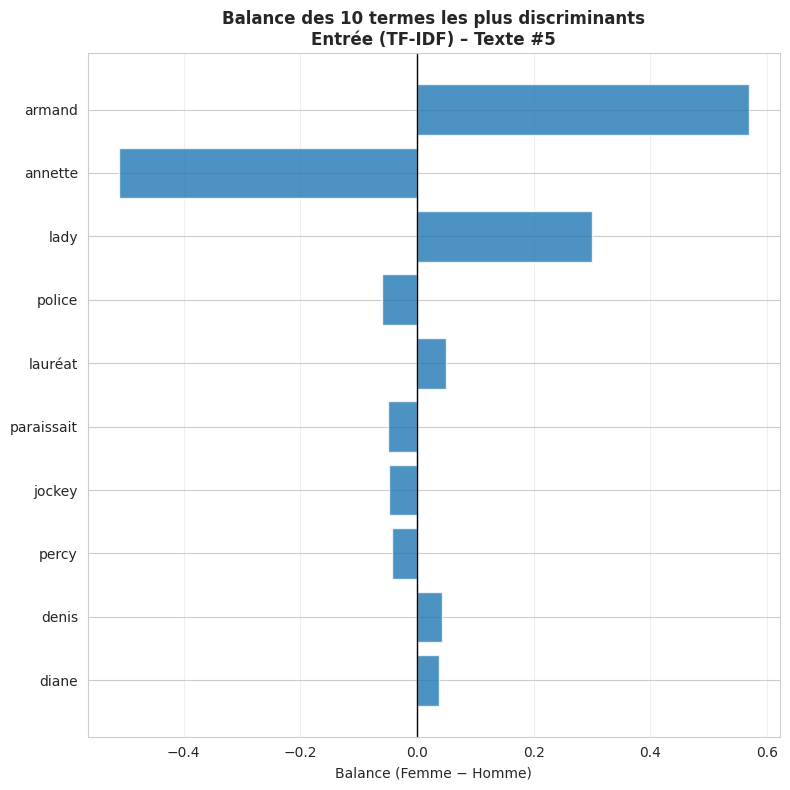

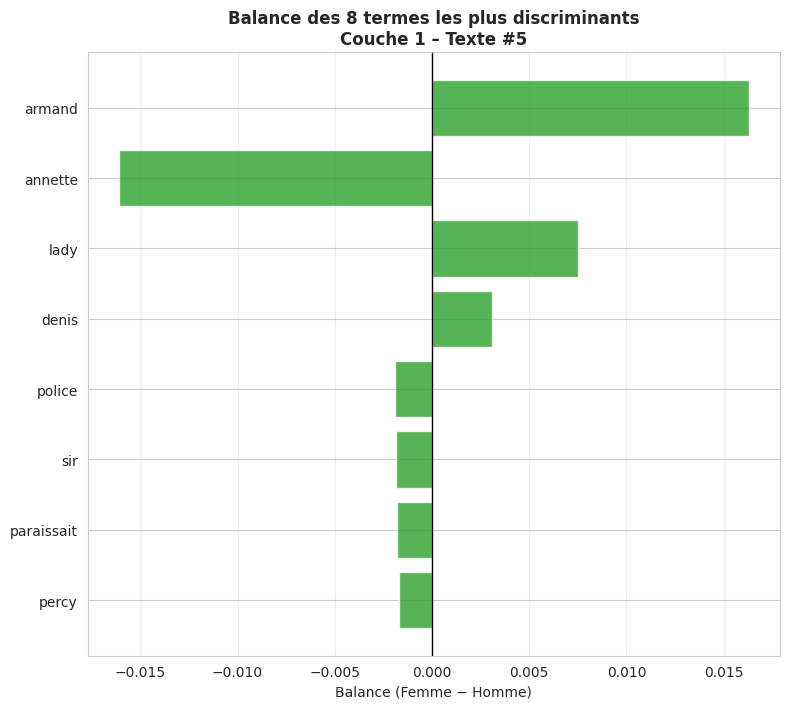

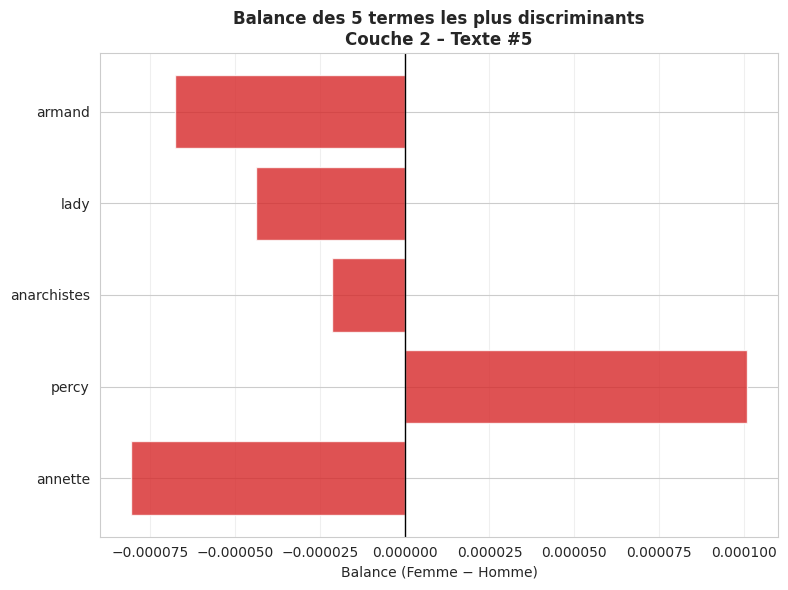

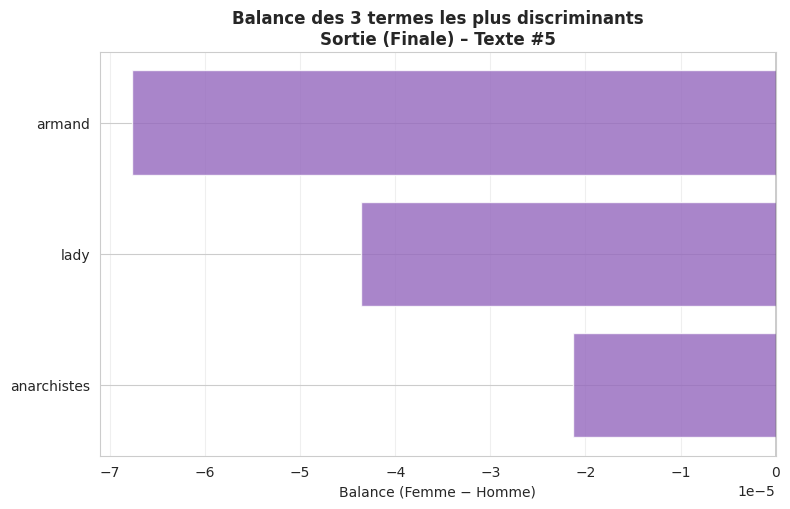

In [ ]:
def visualize_balance_single_text_by_layer(
    model, tfidf, le, text_idx, device
):
    model.eval()
    feature_names = tfidf.get_feature_names_out()
    vocab_size = len(feature_names)

    text = test_df.iloc[text_idx]["text"]
    X = tfidf.transform([text]).toarray()
    X_tensor = torch.FloatTensor(X).to(device)
    X_tensor.requires_grad = True

    outputs, activations = model(X_tensor, return_activations=True)
    a1 = activations["a1"]
    a2 = activations["a2"]

    W1 = model.fc1.weight.data.cpu().numpy()
    W2 = model.fc2.weight.data.cpu().numpy()
    W3 = model.fc3.weight.data.cpu().numpy()  

    present_indices = np.where(X[0] > 0)[0]

    layer_results = {
        "input": {"femme": np.zeros(vocab_size), "homme": np.zeros(vocab_size)},
        "L1": {"femme": np.zeros(vocab_size), "homme": np.zeros(vocab_size)},
        "L2": {"femme": np.zeros(vocab_size), "homme": np.zeros(vocab_size)},
        "output": {"femme": np.zeros(vocab_size), "homme": np.zeros(vocab_size)},  # AJOUT
    }

    for class_idx, class_name in enumerate(le.classes_):
        grad_input, grad_a1, grad_a2 = torch.autograd.grad(
            outputs=outputs[0, class_idx],
            inputs=[X_tensor, a1, a2],
            retain_graph=True
        )

        grad_input = grad_input[0].cpu().numpy()
        grad_a1 = grad_a1[0].cpu().numpy()
        grad_a2 = grad_a2[0].cpu().numpy()

        class_weights = W3[class_idx]  

        for word_idx in present_indices:
            x_val = X[0, word_idx]

            # Entrée
            layer_results["input"][class_name][word_idx] = grad_input[word_idx] * x_val

            # Couche 1
            contrib_L1 = sum(
                W1[n, word_idx] * x_val * grad_a1[n]
                for n in range(len(grad_a1))
            )
            layer_results["L1"][class_name][word_idx] = contrib_L1

            # Couche 2 
            contrib_L2 = 0.0
            for l2 in range(len(grad_a2)):
                for l1 in range(len(grad_a1)):
                    contrib_L2 += (
                        W1[l1, word_idx]
                        * x_val
                        * grad_a1[l1]
                        * W2[l2, l1]
                        * grad_a2[l2]
                    )
            layer_results["L2"][class_name][word_idx] = contrib_L2

            # Sortie (contribution finale)
            contrib_output = 0.0
            for l2 in range(len(grad_a2)):
                l2_weight_to_output = class_weights[l2]
                for l1 in range(len(grad_a1)):
                    contrib_output += (
                        W1[l1, word_idx]
                        * x_val
                        * grad_a1[l1]
                        * W2[l2, l1]
                        * l2_weight_to_output
                    )
            layer_results["output"][class_name][word_idx] = contrib_output

    layer_config = {
        "input": 10,
        "L1": 8,
        "L2": 5,
        "output": 3  
    }

    layer_titles = {
        "input": "Entrée (TF-IDF)",
        "L1": "Couche 1",
        "L2": "Couche 2",
        "output": "Sortie (Finale)"  
    }

    colors = {
        "input": "#1f77b4",
        "L1": "#2ca02c",
        "L2": "#d62728",
        "output": "#9467bd"  
    }

    for layer, top_k in layer_config.items():

        femme = layer_results[layer]["femme"]
        homme = layer_results[layer]["homme"]

        importance = np.abs(femme) + np.abs(homme)
        valid_idx = present_indices

        sorted_idx = valid_idx[np.argsort(importance[valid_idx])[-top_k:]]
        balances = femme[sorted_idx] - homme[sorted_idx]

        words = [feature_names[i] for i in sorted_idx]

        fig, ax = plt.subplots(figsize=(8, 4 + top_k * 0.4))

        ax.barh(
            range(len(words)),
            balances,
            color=colors[layer],
            alpha=0.8
        )

        ax.set_yticks(range(len(words)))
        ax.set_yticklabels(words)
        ax.axvline(0, color="black", linewidth=1)
        ax.set_xlabel("Balance (Femme − Homme)")
        ax.set_title(
            f"Balance des {top_k} termes les plus discriminants\n"
            f"{layer_titles[layer]} – Texte #{text_idx}",
            fontweight="bold"
        )

        ax.grid(True, axis="x", alpha=0.3)
        plt.tight_layout()
        plt.show()

visualize_balance_single_text_by_layer(
    model=model,
    tfidf=tfidf,
    le=le,
    text_idx=5,  # change l’index si besoin
    device=device
)